In [1]:

import pandas as pd
import numpy as np
import sklearn.svm as svm
import pickle
import os

from sklearn.metrics.pairwise import rbf_kernel
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_recall_fscore_support
standard_scaler = StandardScaler()
import time
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, roc_auc_score
from collections import defaultdict
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import rbf_kernel as RBF
import pickle as pkl
###


#evaluate the solution
from sklearn.metrics import accuracy_score, roc_auc_score 
from sklearn.metrics import roc_curve, auc

from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

from yellowbrick.features import Rank1D
from yellowbrick.datasets import load_game
from yellowbrick.datasets import load_hobbies
from yellowbrick.datasets import load_concrete
from yellowbrick.datasets import load_occupancy
from yellowbrick.text import FreqDistVisualizer
from yellowbrick.model_selection import CVScores
from yellowbrick.features import FeatureImportances
from yellowbrick.contrib.missing import MissingValuesBar
from yellowbrick.target import ClassBalance, FeatureCorrelation

from yellowbrick.classifier.confusion_matrix import *

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
# Feature Analysis Imports 
from yellowbrick.features import JointPlotVisualizer
from yellowbrick.features import ParallelCoordinates
from yellowbrick.features import PCADecomposition
from yellowbrick.features import Rank1D, Rank2D 
from yellowbrick.features import RadViz 
%matplotlib inline


In [2]:
from matplotlib.ticker import ScalarFormatter,AutoMinorLocator
import matplotlib as mpl
import matplotlib.pyplot as plt
styleFiles = os.listdir(mpl.get_configdir())
styleFileIdx = 1
print(styleFiles[styleFileIdx])
plt.style.use(os.path.join(mpl.get_configdir(), styleFiles[styleFileIdx]))

plot_style.mplstyle


## functions

In [3]:

def open_pickle_file(path, pickle_file):
    file_loc = os.path.join(path, pickle_file)
    pickle_to_file = pickle.load(open(file_loc, "rb"), encoding='latin1')
    return pickle_to_file

#### locations

In [4]:
figuresDestination ='/home/ak/Documents/Research/Papers/figures/'
hardDriveLoc = '/media/ak/'
dataOnlyFolder = '/media/ak/DataOnly'  # external date only drive
symbolFeaturesDirectories  = os.path.join(dataOnlyFolder, 'SymbolFeatureDirectories')
ExperimentCommonLocs = os.path.join(dataOnlyFolder,'ExperimentCommonLocs')

labelsLocations = {'One': os.path.join(ExperimentCommonLocs, 'LabelsAlternateOne'),
                  'Two': os.path.join(ExperimentCommonLocs, 'LabelsAlternateTwo'),
                  'Three': os.path.join(ExperimentCommonLocs, 'LabelsAlternateThree'),
                  'Four': os.path.join(ExperimentCommonLocs, 'LabelsAlternateFour'),
                  'File':os.path.join(ExperimentCommonLocs, 'LabelsAlternateFive'),
                  'Six': os.path.join(ExperimentCommonLocs, 'LabelsAlternateSix')}

In [5]:
symbols = sorted(os.listdir(symbolFeaturesDirectories))
mpl.get_configdir()

'/home/ak/.config/matplotlib'

## choosing the right format for the various plots

## picking one specific symbol


In [237]:
symbolIdx = 8
symbolSpecificFeaturesDirectors = os.path.join(symbolFeaturesDirectories, symbols[symbolIdx])
print('you chose symbol:', symbols[symbolIdx])
symbolFeaturesLocation = "/".join((symbolSpecificFeaturesDirectors, 'MODEL_BASED'))  # where all the HMM output is
print('your features are here-in pickle format:',symbolFeaturesLocation)
labelsIdx = 'Three' 
print('you are picking Label', labelsIdx)
LabelsFilesPath = os.path.join(labelsLocations['Two'], symbols[symbolIdx])
LabelsFiles = os.listdir(LabelsFilesPath)

you chose symbol: CEY.L
your features are here-in pickle format: /media/ak/DataOnly/SymbolFeatureDirectories/CEY.L/MODEL_BASED
you are picking Label Three


In [238]:
dates = os.listdir(symbolFeaturesLocation)
dateIdx = 12
dateSpecificDirectory = os.path.join(symbolFeaturesLocation, dates[dateIdx])
dateSpecificFiles = sorted(os.listdir(dateSpecificDirectory))
dateSpecificFiles

['CEY.L_3_states_features_date:_20180205_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180205_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180206_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180206_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180207_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180207_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180208_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180208_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180209_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180209_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180212_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180212_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180213_now:_20181224_.pickle',
 'CEY.L_3_states_features_date:_20180213_now:_20190108_.pickle',
 'CEY.L_3_states_features_date:_20180214_now:_20181224_.pickle',
 'CEY.L_3_states_features

In [253]:
idx = 6
specificFile = os.path.join(dateSpecificDirectory, dateSpecificFiles[idx])
featuresTupleFile  = open_pickle_file(dateSpecificDirectory, dateSpecificFiles[idx])
label_date = specificFile.split("_")[6]
labelDateFile = os.path.join(LabelsFilesPath, str(label_date) +'.csv')
if os.path.isfile(labelDateFile):
    df = pd.read_csv(labelDateFile)
else:
    print('not a valid dates file')
    
labelName = str(df.columns[df.columns.str.contains(pat='label')].values[0])
labels = df[df.columns[df.columns.str.contains(pat='label')]].iloc[:, 0]

In [254]:
dfFeatures = pd.concat([featuresTupleFile[0], featuresTupleFile[1],\
                                             featuresTupleFile[2], featuresTupleFile[3]], axis=1, sort=False).fillna(0)


In [255]:
features= list(dfFeatures.columns.values)

In [256]:
X = pd.get_dummies(dfFeatures)
# Convert unique classes (strings) into integers
encoder = LabelEncoder()
y = encoder.fit_transform(labels)

In [257]:
plt.style.use('seaborn')

visualizer = PCADecomposition(scale=True, center=True, col=y)
visualizer.fit_transform(X,y)
visualizer.show()
# Tweak spacing to prevent clipping of ylabel
plt.tight_layout()

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/decomposition/pca.py:536: RuntimeWarning: invalid value encountered in true_divide
  self.explained_variance_ / total_var.sum()


<Figure size 9600x6600 with 0 Axes>

In [244]:

params = {'scale': True, 'color': y}
visualizer = PCADecomposition(**params)
_ =visualizer.fit(X)
_ =visualizer.transform(X)
plt.title('')
_ =visualizer.show()

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/decomposition/pca.py:536: RuntimeWarning: invalid value encountered in true_divide
  self.explained_variance_ / total_var.sum()


In [245]:
plt.style.use('seaborn')
# width = 345

# tex_fonts = {
#     # Use LaTeX to write all text
# #     "text.usetex": True,
#     "font.family": "serif",
#     # Use 10pt font in plots, to match 10pt font in document
#     "axes.labelsize": 10,
#     "font.size": 10,
#     # Make the legend/label fonts a little smaller
#     "legend.fontsize": 8,
#     "xtick.labelsize": 8,
#     "ytick.labelsize": 8
# }

# plt.rcParams.update(tex_fonts)

In [246]:
# Instantiate the visualizer with the Covariance ranking algorithm 
my_title = ''


In [247]:

visualizer = Rank1D(algorithm='shapiro', color=["cadetblue"], title ='   ')

visualizer.fit(X, y)
visualizer.transform(X)
plt.tight_layout()
visualizer.show(outpath=locationFileName)

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/scipy/stats/morestats.py:1673: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


<AxesSubplot:title={'left':'   '}>

In [203]:
from yellowbrick.datasets import load_concrete
from yellowbrick.features import JointPlotVisualizer

# Instantiate the visualizer
visualizer = JointPlotVisualizer(columns=["ksi_2_to_2", "ksi_1_to_2"])

visualizer.fit_transform(X, y)        # Fit and transform the data
visualizer.show()                     # Finalize and render the figure

<AxesSubplot:xlabel='ksi_2_to_2', ylabel='ksi_1_to_2'>

In [204]:
# Instantiate the visualizer with the Covariance ranking algorithm 
from yellowbrick.style import set_palette
set_palette('pastel')
visualizer = Rank2D(features=features, algorithm='pearson', title = '  ')

visualizer.fit(X, y)                # Fit the data to the visualizer
visualizer.transform(X)             # Transform the data
visualizer.show()                   # Finalize and render the visualizer
locationFileName = os.path.join('/home/ak/Documents/Research/Papers/figures',str(symbols[symbolIdx])+'_pearsonCorrel.png')

visualizer.show(outpath=locationFileName)

<AxesSubplot:title={'left':'  '}>

<Figure size 9600x6600 with 0 Axes>

In [205]:
from yellowbrick.features import PCA

visualizer = PCA(scale=True, proj_features=True)

visualizer.fit_transform(X, y)
visualizer.show()

<AxesSubplot:title={'left':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

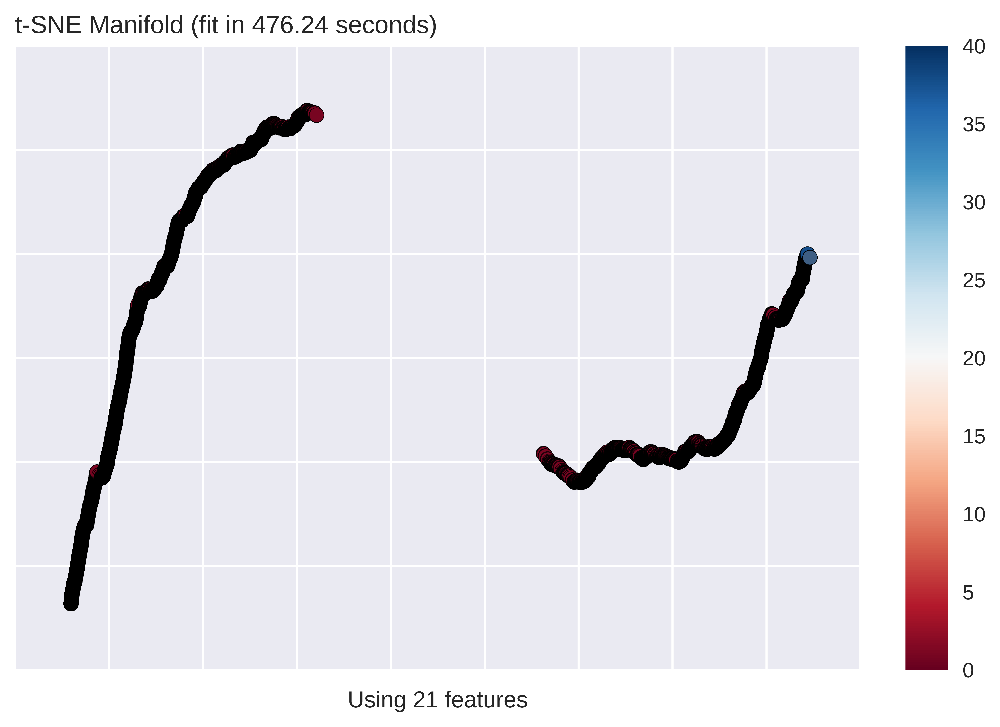

<AxesSubplot:title={'left':'t-SNE Manifold (fit in 476.24 seconds)'}, xlabel='Using 21 features'>

In [206]:
from yellowbrick.features import Manifold
# Instantiate the visualizer
viz = Manifold(manifold="tsne", classes=classes)

viz.fit_transform(X, y)  # Fit the data to the visualizer
viz.show()               # Finalize and render the figure

In [207]:
columns = X.columns.values
gamma_columns = [f for f in columns if str('gamma') in f]


In [208]:
gamma_columns

['gamma_0', 'gamma_1', 'gamma_2']

In [209]:
print(columns)

['fischer_score_dlambda' 'fischer_score_dsigma' 'fischer_score_dweight'
 'lambda_lambda' 'lambda_sigma' 'lambda_weight' 'sigma_sigma'
 'sigma_weight' 'weight_weight' 'gamma_0' 'gamma_1' 'gamma_2' 'ksi_0_to_0'
 'ksi_0_to_1' 'ksi_0_to_2' 'ksi_1_to_0' 'ksi_1_to_1' 'ksi_1_to_2'
 'ksi_2_to_0' 'ksi_2_to_1' 'ksi_2_to_2']


In [210]:
visualizer = PCA(scale=True, proj_features=True, projection=2 ,title = '  ')
gamma = X[gamma_columns]
visualizer.fit_transform(gamma, y)
visualizer.show()

<AxesSubplot:title={'left':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [211]:
reduced_columns = ['fischer_score_dlambda',
                   'fischer_score_dsigma',
                   'fischer_score_dweight',
                    'lambda_lambda', 'lambda_sigma', 'lambda_weight',
                   'sigma_sigma',
                     'sigma_weight' ,
                   'weight_weight' , 
                   'ksi_1_to_1']

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/yellowbrick/features/pca.py:448: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout()


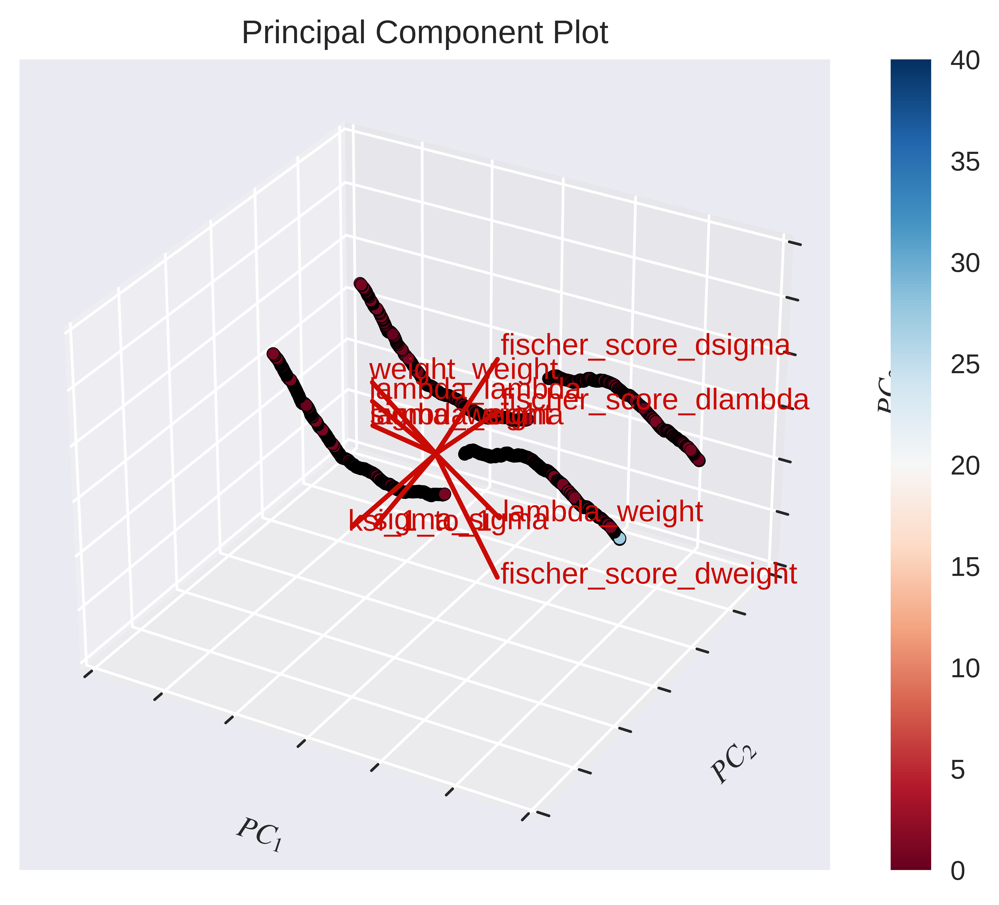

<Axes3DSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [212]:
visualizer = PCA(scale=True, proj_features=True, projection=3 ,title = '  ')
reduced = X[reduced_columns]
visualizer.fit_transform(reduced, y)
visualizer.show()

In [217]:

# Instantiate the visualizer
visualizer = RadViz(classes=classes)

visualizer.fit(X, y)           # Fit the data to the visualizer
visualizer.transform(X)        # Transform the data
visualizer.show()              # Finalize and render the figure


YellowbrickValueError: number of specified classes does not match number of unique values in target

In [221]:
y

array([ 1,  1,  1, ..., 17, 22, 40])

## Feature Importance 

In [213]:
# yellowbrick.features.importances
# Feature importance visualizer
#
# Author:  Benjamin Bengfort <benjamin@bengfort.com>
# Created: Fri Mar 02 15:21:36 2018 -0500
# Author:  Rebecca Bilbro <rbilbro@districtdatalabs.com>
# Updated: Sun Jun 24 10:53:36 2018 -0500
#
# Copyright (C) 2018 District Data Labs
# For license information, see LICENSE.txt
#
# ID: importances.py [] benjamin@bengfort.com $

"""
Implementation of a feature importances visualizer. This visualizer sits in
kind of a weird place since it is technically a model scoring visualizer, but
is generally used for feature engineering.
"""

##########################################################################
## Imports
##########################################################################


from yellowbrick.utils import is_dataframe
from yellowbrick.base import ModelVisualizer
from yellowbrick.exceptions import YellowbrickTypeError, NotFitted


##########################################################################
## Feature Visualizer
##########################################################################

class FeatureImportances(ModelVisualizer):
    """
    Displays the most informative features in a model by showing a bar chart
    of features ranked by their importances. Although primarily a feature
    engineering mechanism, this visualizer requires a model that has either a
    ``coef_`` or ``feature_importances_`` parameter after fit.

    Parameters
    ----------
    model : Estimator
        A Scikit-Learn estimator that learns feature importances. Must support
        either ``coef_`` or ``feature_importances_`` parameters.

    ax : matplotlib Axes, default: None
        The axis to plot the figure on. If None is passed in the current axes
        will be used (or generated if required).

    labels : list, default: None
        A list of feature names to use. If a DataFrame is passed to fit and
        features is None, feature names are selected as the column names.

    relative : bool, default: True
        If true, the features are described by their relative importance as a
        percentage of the strongest feature component; otherwise the raw
        numeric description of the feature importance is shown.

    absolute : bool, default: False
        Make all coeficients absolute to more easily compare negative
        coeficients with positive ones.

    xlabel : str, default: None
        The label for the X-axis. If None is automatically determined by the
        underlying model and options provided.

    kwargs : dict
        Keyword arguments that are passed to the base class and may influence
        the visualization as defined in other Visualizers.

    Attributes
    ----------
    features_ : np.array
        The feature labels ranked according to their importance

    feature_importances_ : np.array
        The numeric value of the feature importance computed by the model

    Examples
    --------

    >>> from sklearn.ensemble import GradientBoostingClassifier
    >>> visualizer = FeatureImportances(GradientBoostingClassifier())
    >>> visualizer.fit(X, y)
    >>> visualizer.show()
    """

    def __init__(self, model, ax=None, labels=None, relative=True,
                 absolute=False, xlabel=None, **kwargs):
        super(FeatureImportances, self).__init__(model, ax, **kwargs)

        # Data Parameters
        self.set_params(
            labels=labels, relative=relative, absolute=absolute,
            xlabel=xlabel,
        )

    def fit(self, X, y=None, **kwargs):
        """
        Fits the estimator to discover the feature importances described by
        the data, then draws those importances as a bar plot.

        Parameters
        ----------
        X : ndarray or DataFrame of shape n x m
            A matrix of n instances with m features

        y : ndarray or Series of length n
            An array or series of target or class values

        kwargs : dict
            Keyword arguments passed to the fit method of the estimator.

        Returns
        -------
        self : visualizer
            The fit method must always return self to support pipelines.
        """
        super(FeatureImportances, self).fit(X, y, **kwargs)

        # Get the feature importances from the model
        self.feature_importances_ = self._find_importances_param()
        
        # Check if feature importances is a multidimensional array & if so flatten
        if self.feature_importances_.ndim > 1:
            self.feature_importances_ = np.mean(self.feature_importances_, axis=0)

        # Apply absolute value filter before normalization
        if self.absolute:
            self.feature_importances_ = np.abs(self.feature_importances_)

        # Normalize features relative to the maximum
        if self.relative:
            maxv = self.feature_importances_.max()
            self.feature_importances_ /= maxv
            self.feature_importances_ *= 100.0

        # Create labels for the feature importances
        # NOTE: this code is duplicated from MultiFeatureVisualizer
        if self.labels is None:
            # Use column names if a dataframe
            if is_dataframe(X):
                self.features_ = np.array(X.columns)

            # Otherwise use the column index as the labels
            else:
                _, ncols = X.shape
                self.features_ = np.arange(0, ncols)
        else:
            self.features_ = np.array(self.labels)

        # Sort the features and their importances
        sort_idx = np.argsort(self.feature_importances_)
        self.features_ = self.features_[sort_idx]
        self.feature_importances_ = self.feature_importances_[sort_idx]

        # Draw the feature importances
        self.draw()
        return self

    def draw(self, **kwargs):
        """
        Draws the feature importances as a bar chart; called from fit.
        """
        # Quick validation
        for param in ('feature_importances_', 'features_'):
            if not hasattr(self, param):
                raise NotFitted("missing required param '{}'".format(param))

        # Find the positions for each bar
        pos = np.arange(self.features_.shape[0]) + 0.5

        # Plot the bar chart
        self.ax.barh(pos, self.feature_importances_, align='center')

        # Set the labels for the bars
        self.ax.set_yticks(pos)
        self.ax.set_yticklabels(self.features_)

        return self.ax

    def finalize(self, **kwargs):
        """
        Finalize the drawing setting labels and title.
        """
        # Set the title
        self.set_title('Feature Importances of {} Features using {}'.format(
                len(self.features_), self.name))

        # Set the xlabel
        self.ax.set_xlabel(self._get_xlabel())

        # Remove the ygrid
        self.ax.grid(False, axis='y')

        # Ensure we have a tight fit
        plt.tight_layout()

    def _find_importances_param(self):
        """
        Searches the wrapped model for the feature importances parameter.
        """
        for attr in ("feature_importances_", "coef_"):
            try:
                return getattr(self.estimator, attr)
            except AttributeError:
                continue

        raise YellowbrickTypeError(
            "could not find feature importances param on {}".format(
                self.estimator.__class__.__name__
            )
        )

    def _get_xlabel(self):
        """
        Determines the xlabel based on the underlying data structure
        """
        # Return user-specified label
        if self.xlabel:
            return self.xlabel

        # Label for coefficients
        if hasattr(self.estimator, "coef_"):
            if self.relative:
                return "relative coefficient magnitude"
            return "coefficient value"

        # Default label for feature_importances_
        if self.relative:
            return "relative importance"
        return "feature importance"

    def _is_fitted(self):
        """
        Returns true if the visualizer has been fit.
        """
        return hasattr(self, 'feature_importances_') and hasattr(self, 'features_')


##########################################################################
## Quick Method
##########################################################################

def feature_importances(model, X, y=None, ax=None, labels=None,
                        relative=True, absolute=False, xlabel=None, **kwargs):
    """
    Displays the most informative features in a model by showing a bar chart
    of features ranked by their importances. Although primarily a feature
    engineering mechanism, this visualizer requires a model that has either a
    ``coef_`` or ``feature_importances_`` parameter after fit.

    Parameters
    ----------
    model : Estimator
        A Scikit-Learn estimator that learns feature importances. Must support
        either ``coef_`` or ``feature_importances_`` parameters.

    X : ndarray or DataFrame of shape n x m
        A matrix of n instances with m features

    y : ndarray or Series of length n, optional
        An array or series of target or class values

    ax : matplotlib Axes, default: None
        The axis to plot the figure on. If None is passed in the current axes
        will be used (or generated if required).

    labels : list, default: None
        A list of feature names to use. If a DataFrame is passed to fit and
        features is None, feature names are selected as the column names.

    relative : bool, default: True
        If true, the features are described by their relative importance as a
        percentage of the strongest feature component; otherwise the raw
        numeric description of the feature importance is shown.

    absolute : bool, default: False
        Make all coeficients absolute to more easily compare negative
        coeficients with positive ones.

    xlabel : str, default: None
        The label for the X-axis. If None is automatically determined by the
        underlying model and options provided.

    kwargs : dict
        Keyword arguments that are passed to the base class and may influence
        the visualization as defined in other Visualizers.

    Returns
    -------
    ax : matplotlib axes
        Returns the axes that the parallel coordinates were drawn on.
    """
    # Instantiate the visualizer
    visualizer = FeatureImportances(
        model, ax, labels, relative, absolute, xlabel, **kwargs)

    # Fit and transform the visualizer (calls draw)
    visualizer.fit(X, y)
    visualizer.finalize()

    # Return the axes object on the visualizer
    return visualizer.ax


In [214]:
my_title = "Random Forest Feature Importance: "+str(symbols[symbolIdx])
model = RandomForestClassifier(n_estimators=10)
colors = ["lightpink", "pink", "hotpink", "crimson", "orchid"]
viz = FeatureImportances(model, colors=colors, title=my_title)
locationFileName = os.path.join('/home/ak/Documents/Research/Papers/figures',str(symbols[symbolIdx])+'_RandForImp.png')
viz.fit(X, y)
viz.show()
viz.show(outpath=locationFileName)

<AxesSubplot:title={'left':'Random Forest Feature Importance: BATS.L'}, xlabel='relative importance'>

<Figure size 9600x6600 with 0 Axes>

In [215]:
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)

model = LogisticRegression(multi_class="auto", solver="liblinear")
viz = FeatureImportances(model, stack=True, relative=False)
viz.fit(X, y)
viz.show()

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


<AxesSubplot:title={'left':'Feature Importances of 21 Features using LogisticRegression'}, xlabel='coefficient value'>

In [216]:

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features, color="rebeccapurple")

visualizer.fit(X, y)
visualizer.show()

<AxesSubplot:title={'left':'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [132]:

from sklearn.linear_model import LassoCV
from yellowbrick.regressor import AlphaSelection

# Create a list of alphas to cross-validate against
alphas = np.logspace(-10, 1, 400)
# Create the train and test data 
X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(X, y, test_size=0.8)
model = LassoCV(alphas=alphas)
visualizer = AlphaSelection(model)

visualizer.fit(X_reg_train, y_reg_train)
g = visualizer.poof()

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.1357118122643897, tolerance: 0.25134650205761316
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.938921129506298, tolerance: 0.25134650205761316
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. 

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 984.1305832325402, tolerance: 0.25134650205761316
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 984.1471450412075, tolerance: 0.25134650205761316
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 984.1628160773154, tolerance: 0.25134650205761316
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0964851451766151, tolerance: 0.012235390946502054
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4128012959507146, tolerance: 0.012235390946502054
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.6849952743165773, tolerance: 0.012235390946502054
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceW

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.05884246426183, tolerance: 0.012235390946502054
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.060122260347036, tolerance: 0.012235390946502054
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.061348380602496, tolerance: 0.012235390946502054
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWa

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 504.04704245235314, tolerance: 0.2595918032786885
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 532.5738543867733, tolerance: 0.2595918032786885
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 559.277607034098, tolerance: 0.2595918032786885
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: O

/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 993.3935174238037, tolerance: 0.2595918032786885
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 993.3981092338878, tolerance: 0.2595918032786885
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 993.4024701294048, tolerance: 0.2595918032786885
  tol, rng, random, positive)
/home/ak/Envs/resrPyth3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:471: ConvergenceWarning: O

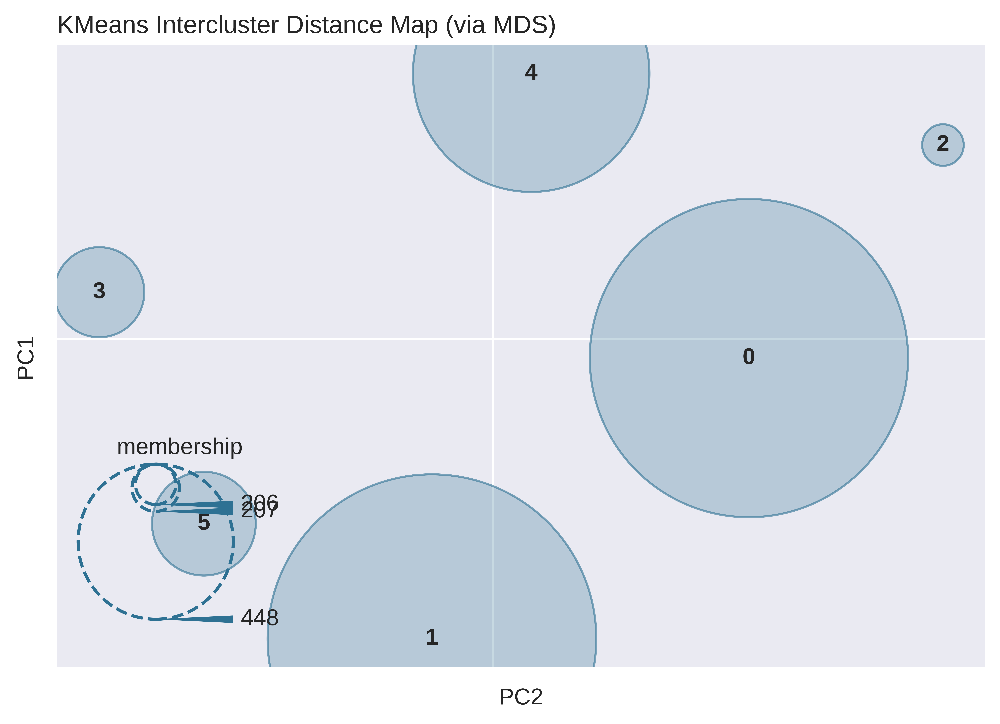

<AxesSubplot:title={'left':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [133]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance

# Instantiate the clustering model and visualizer
model = KMeans(6)
visualizer = InterclusterDistance(model)
visualizer.fit(X) # Fit the data to the visualizer
visualizer.show()
# visualizer.show(outpath=locationFileName) # Finalize and render the figure